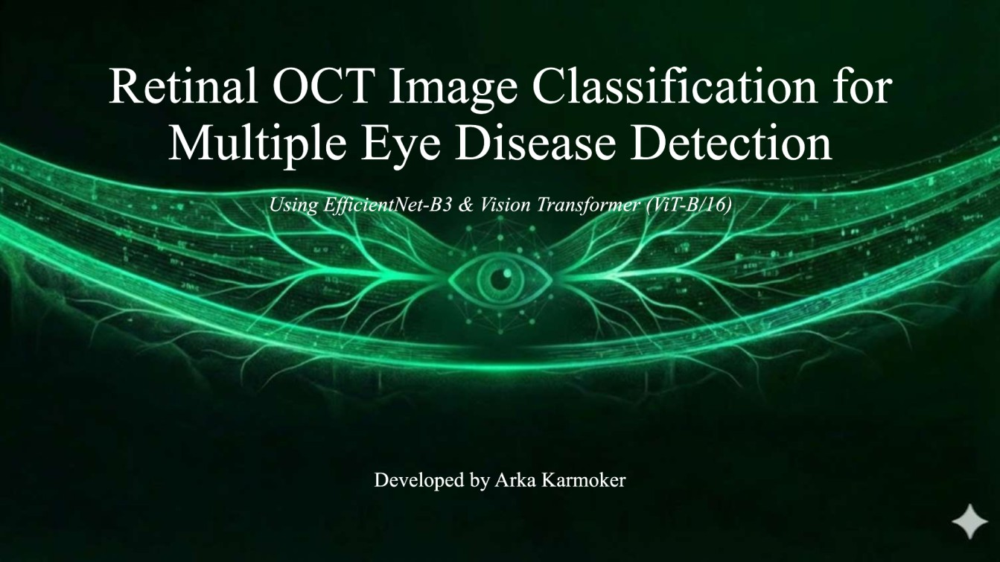

# 🔬 Retinal OCT Image Classification for Multiple Eye Disease Detection​
### Comparative Study: EfficientNet-B3 vs Vision Transformer (ViT-B/16)

---

| Field | Details |
|---|---|
| **Name** | Arka Karmoker |
| **ID** | 2112343042 |
| **Email** | arka.karmoker@northsouth.edu |
| **Major** | Computer Science & Engineering (CSE) |
| **Course** | CSE 465 Pattern Recognition and Neural Network |
| **Section** | 3 |
| **Semester** | Spring 2026 |
| **Faculty** | Dr. Mohammad Ashrafuzzaman Khan [AzK] |
| **Department** | Department of Electrical and Computer Engineering (ECE) |
| **University** | North South University |
| **Dataset** | Retinal OCT Image Classification – C8 (24,000 images) |
| **Models** | EfficientNet-B3 · Vision Transformer (ViT-B/16) |
| **Project** | Retinal OCT Image Classification for Multiple Eye Disease Detection |

---

### 🎯 Objective
Build and compare two state-of-the-art deep learning models to classify retinal OCT images into **8 disease categories**, enabling automated screening assistance for ophthalmologists.

### 📋 Disease Classes
| Class | Full Name |
|---|---|
| AMD | Age-related Macular Degeneration |
| CNV | Choroidal Neovascularization |
| CSR | Central Serous Retinopathy |
| DME | Diabetic Macular Edema |
| DR | Diabetic Retinopathy |
| DRUSEN | Yellow Deposits Under the Retina |
| MH | Macular Hole |
| NORMAL | Healthy Eyes (No Abnormalities) |
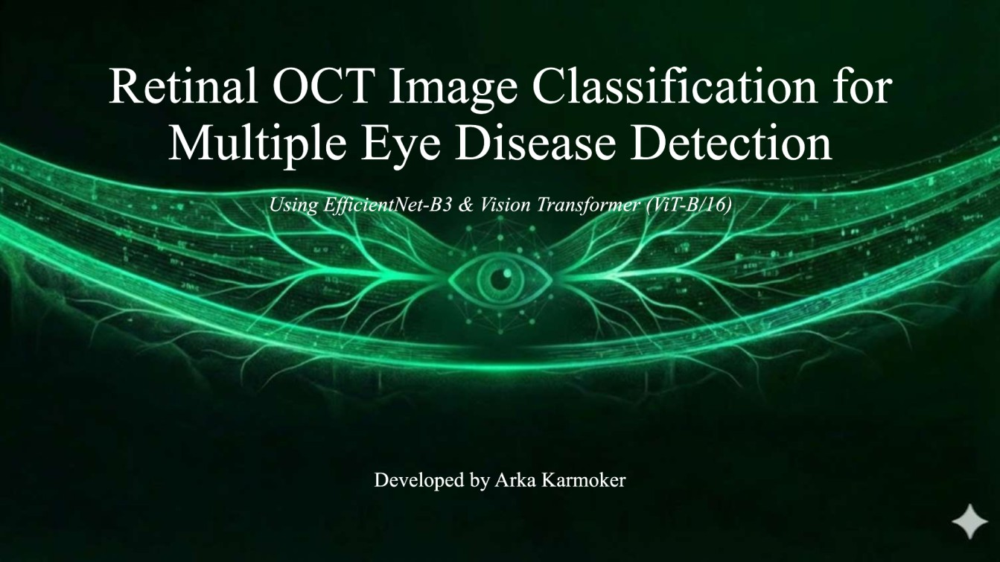
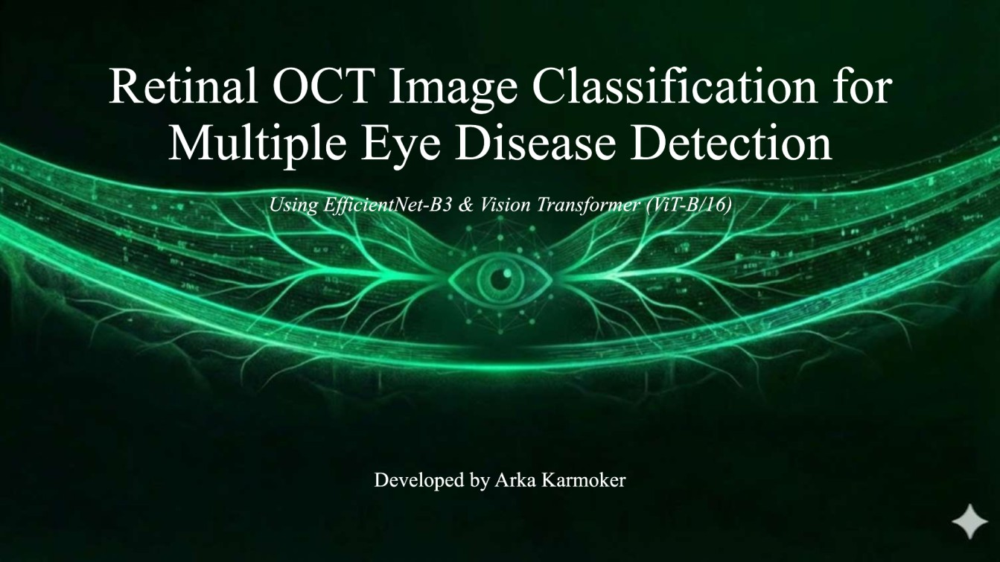
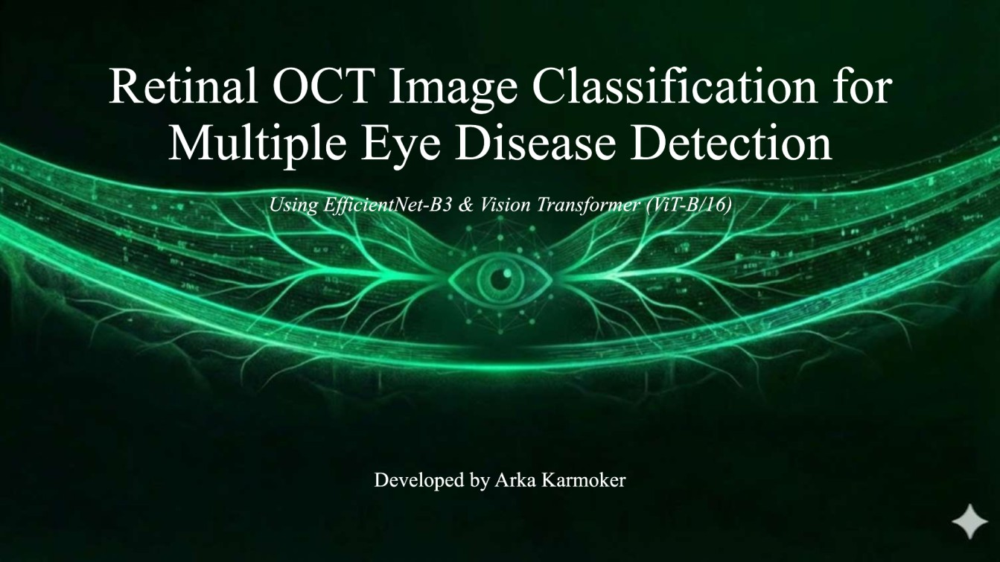
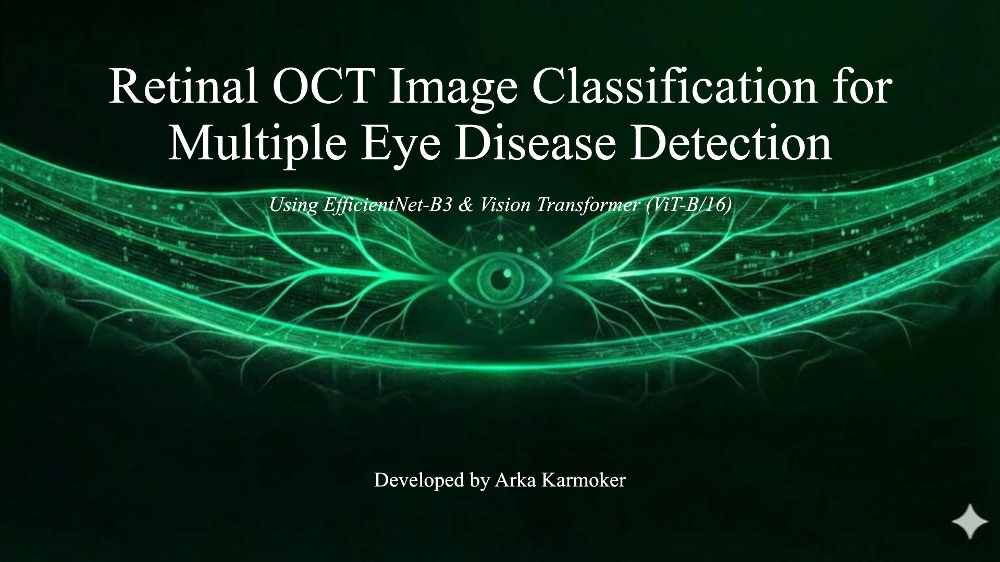

In [1]:
# ── Core ──────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import os, glob, random, time, warnings, json
warnings.filterwarnings('ignore')

# ── Visualization ─────────────────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image

# ── Deep Learning ─────────────────────────────────────────────────────
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import timm

# ── Metrics ───────────────────────────────────────────────────────────
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)
from tqdm.notebook import tqdm

# ── Reproducibility ───────────────────────────────────────────────────
SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

# ── Device ────────────────────────────────────────────────────────────
device    = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_gpus  = torch.cuda.device_count()

print(f"{'='*55}")
print(f"  🚀 Device      : {device}")
print(f"  🖥️  GPUs Found  : {num_gpus}")
for i in range(num_gpus):
    print(f"     • GPU {i}    : {torch.cuda.get_device_name(i)}")
print(f"{'='*55}")

# ── Global Style ──────────────────────────────────────────────────────
plt.rcParams.update({'figure.dpi': 130, 'font.family': 'DejaVu Sans',
                     'axes.titlesize': 14, 'axes.labelsize': 12})
sns.set_theme(style='darkgrid')

# ── Project Constants ─────────────────────────────────────────────────
CLASS_NAMES = ['AMD', 'CNV', 'CSR', 'DME', 'DR', 'DRUSEN', 'MH', 'NORMAL']
CLASS_FULL  = {
    'AMD'   : 'Age-related Macular Degeneration',
    'CNV'   : 'Choroidal Neovascularization',
    'CSR'   : 'Central Serous Retinopathy',
    'DME'   : 'Diabetic Macular Edema',
    'DR'    : 'Diabetic Retinopathy',
    'DRUSEN': 'Yellow Deposits Under Retina',
    'MH'    : 'Macular Hole',
    'NORMAL': 'Healthy Eyes (No Abnormalities)'
}
NUM_CLASSES = len(CLASS_NAMES)
IMG_SIZE    = 224
BATCH_SIZE  = 128 
EPOCHS      = 8    
NUM_WORKERS = 2     

# Colour palette
PAL = ['#1a73e8','#34a853','#ea4335','#fbbc04',
       '#7c4dff','#00897b','#e91e63','#ff6d00']

print(f"\n✅ Setup complete  |  Classes: {NUM_CLASSES}  |  Img: {IMG_SIZE}px  |  Batch: {BATCH_SIZE}")

  🚀 Device      : cuda
  🖥️  GPUs Found  : 2
     • GPU 0    : Tesla T4
     • GPU 1    : Tesla T4

✅ Setup complete  |  Classes: 8  |  Img: 224px  |  Batch: 128


## 📂 Step 1 — Dataset Exploration & Visualization
Analysing the folder structure, class distribution, and sample images of the
**Retinal OCT Image Classification – C8** dataset.

📁 Dataset root : /kaggle/input/datasets/obulisainaren/retinal-oct-c8/RetinalOCT_Dataset/RetinalOCT_Dataset
   ├── train   : /kaggle/input/datasets/obulisainaren/retinal-oct-c8/RetinalOCT_Dataset/RetinalOCT_Dataset/train
   ├── val     : /kaggle/input/datasets/obulisainaren/retinal-oct-c8/RetinalOCT_Dataset/RetinalOCT_Dataset/val
   └── test    : /kaggle/input/datasets/obulisainaren/retinal-oct-c8/RetinalOCT_Dataset/RetinalOCT_Dataset/test

📊 Image counts per class:

        Train  Validation  Test  Total
AMD      2300         350   350   3000
CNV      2300         350   350   3000
CSR      2300         350   350   3000
DME      2300         350   350   3000
DR       2300         350   350   3000
DRUSEN   2300         350   350   3000
MH       2300         350   350   3000
NORMAL   2300         350   350   3000

─────────────────────────────────────────────
  Grand Total : 24,000 images


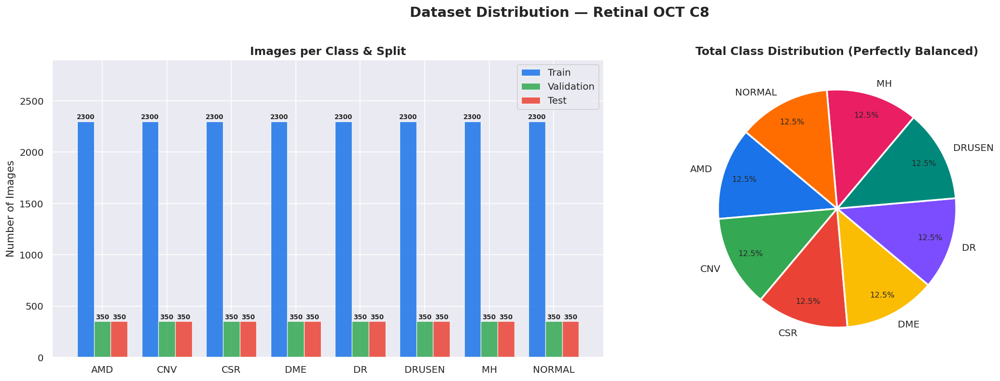

✅ Figure 1 saved.


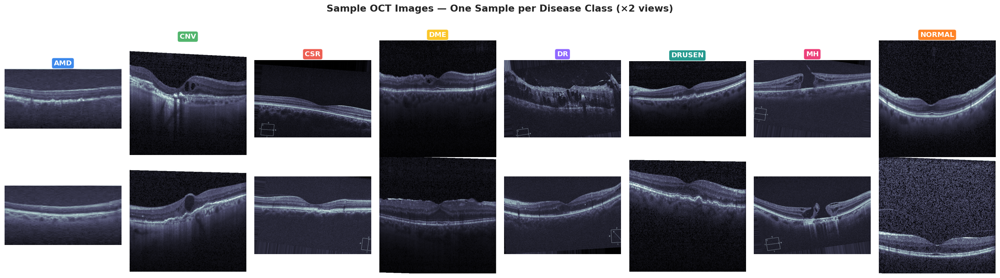

✅ Figure 2 saved.

🔍 Sampling image dimensions from training set…


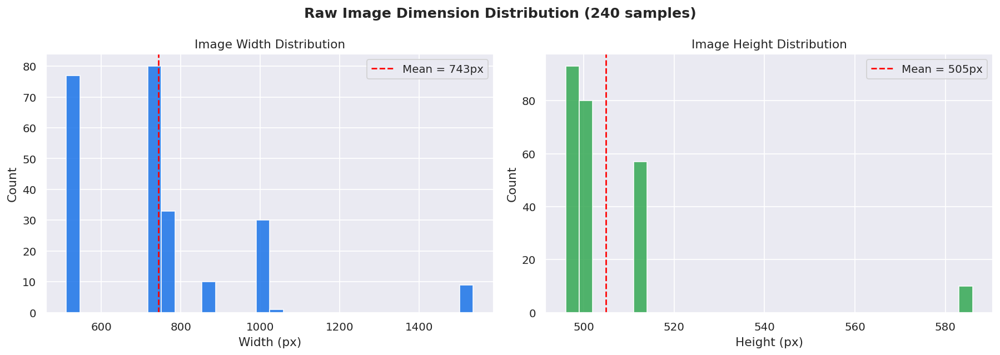

✅ Figure 3 saved.  |  Avg size: 743 × 505 px


In [2]:
# ── Auto-detect Dataset Root ──────────────────────────────────────────
DATA_ROOT = None
for root, dirs, _ in os.walk('/kaggle/input'):
    if 'train' in dirs and ('val' in dirs or 'test' in dirs):
        DATA_ROOT = root
        break

assert DATA_ROOT, "❌ Dataset root not found. Check dataset is attached."

TRAIN_DIR = os.path.join(DATA_ROOT, 'train')
VAL_DIR   = os.path.join(DATA_ROOT, 'val')
TEST_DIR  = os.path.join(DATA_ROOT, 'test')

print(f"📁 Dataset root : {DATA_ROOT}")
print(f"   ├── train   : {TRAIN_DIR}")
print(f"   ├── val     : {VAL_DIR}")
print(f"   └── test    : {TEST_DIR}\n")

# ── Count images per split per class ─────────────────────────────────
splits = {'Train': TRAIN_DIR, 'Validation': VAL_DIR, 'Test': TEST_DIR}
counts = {}
for split, path in splits.items():
    counts[split] = {}
    for cls in CLASS_NAMES:
        cls_path = os.path.join(path, cls)
        counts[split][cls] = len(glob.glob(os.path.join(cls_path, '*.*'))) if os.path.exists(cls_path) else 0

df_counts = pd.DataFrame(counts)
df_counts['Total'] = df_counts.sum(axis=1)
print("📊 Image counts per class:\n")
print(df_counts.to_string())
print(f"\n{'─'*45}")
print(f"  Grand Total : {df_counts['Total'].sum():,} images")

# ── Figure 1: Class Distribution Grouped Bar Chart ───────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Dataset Distribution — Retinal OCT C8', fontsize=16, fontweight='bold', y=1.01)

x     = np.arange(NUM_CLASSES)
width = 0.26
split_colors = ['#1a73e8', '#34a853', '#ea4335']
for i, (split, color) in enumerate(zip(['Train', 'Validation', 'Test'], split_colors)):
    vals = [counts[split][c] for c in CLASS_NAMES]
    bars = axes[0].bar(x + i*width, vals, width, label=split,
                       color=color, alpha=0.85, edgecolor='white', linewidth=0.7)
    for bar in bars:
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                     f'{int(bar.get_height())}', ha='center', va='bottom',
                     fontsize=7.5, fontweight='bold')

axes[0].set_xticks(x + width)
axes[0].set_xticklabels(CLASS_NAMES, fontsize=11)
axes[0].set_ylabel('Number of Images', fontsize=12)
axes[0].set_title('Images per Class & Split', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].set_ylim(0, 2900)

total_vals = [df_counts.loc[c, 'Total'] for c in CLASS_NAMES]
wedges, texts, autotexts = axes[1].pie(
    total_vals, labels=CLASS_NAMES, autopct='%1.1f%%',
    colors=PAL, startangle=140, pctdistance=0.82,
    wedgeprops=dict(edgecolor='white', linewidth=2)
)
for at in autotexts:
    at.set_fontsize(9)
axes[1].set_title('Total Class Distribution (Perfectly Balanced)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig('fig1_class_distribution.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 1 saved.")

# ── Figure 2: Sample OCT Images — 2×8 grid (2 rows, 1 per class) ─────
fig, axes = plt.subplots(2, 8, figsize=(22, 6))
fig.suptitle('Sample OCT Images — One Sample per Disease Class (×2 views)',
             fontsize=15, fontweight='bold', y=1.02)

for col_idx, cls in enumerate(CLASS_NAMES):
    cls_path   = os.path.join(TRAIN_DIR, cls)
    all_imgs   = glob.glob(os.path.join(cls_path, '*.jpeg')) + \
                 glob.glob(os.path.join(cls_path, '*.jpg'))  + \
                 glob.glob(os.path.join(cls_path, '*.png'))
    sampled    = random.sample(all_imgs, min(2, len(all_imgs)))

    for row_idx in range(2):
        ax = axes[row_idx][col_idx]
        if row_idx < len(sampled):
            img = Image.open(sampled[row_idx]).convert('L')
            ax.imshow(img, cmap='bone')
        ax.axis('off')
        if row_idx == 0:
            ax.set_title(
                cls, fontsize=11, fontweight='bold', color='white',
                bbox=dict(boxstyle='round,pad=0.3', facecolor=PAL[col_idx], alpha=0.85)
            )

plt.tight_layout()
plt.savefig('fig2_sample_images.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 2 saved.")

# ── Figure 3: Image Size Distribution ────────────────────────────────
print("\n🔍 Sampling image dimensions from training set…")
widths, heights = [], []
for cls in CLASS_NAMES:
    cls_path  = os.path.join(TRAIN_DIR, cls)
    all_imgs  = glob.glob(os.path.join(cls_path, '*.jpeg')) + \
                glob.glob(os.path.join(cls_path, '*.jpg'))  + \
                glob.glob(os.path.join(cls_path, '*.png'))
    sample    = random.sample(all_imgs, min(30, len(all_imgs)))
    for p in sample:
        img = Image.open(p)
        widths.append(img.size[0])
        heights.append(img.size[1])

mean_w = np.mean(widths)
mean_h = np.mean(heights)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Raw Image Dimension Distribution (240 samples)', fontsize=14, fontweight='bold')

axes[0].hist(widths,  bins=30, color='#1a73e8', edgecolor='white', alpha=0.85)
axes[0].set_xlabel('Width (px)');  axes[0].set_ylabel('Count')
axes[0].set_title('Image Width Distribution')
axes[0].axvline(mean_w, color='red', linestyle='--', linewidth=1.5, label=f'Mean = {mean_w:.0f}px')
axes[0].legend()

axes[1].hist(heights, bins=30, color='#34a853', edgecolor='white', alpha=0.85)
axes[1].set_xlabel('Height (px)'); axes[1].set_ylabel('Count')
axes[1].set_title('Image Height Distribution')
axes[1].axvline(mean_h, color='red', linestyle='--', linewidth=1.5, label=f'Mean = {mean_h:.0f}px')
axes[1].legend()

plt.tight_layout()
plt.savefig('fig3_dimension_dist.png', bbox_inches='tight', dpi=130)
plt.show()
print(f"✅ Figure 3 saved.  |  Avg size: {mean_w:.0f} × {mean_h:.0f} px")

## ⚙️ Step 2 — Preprocessing, Augmentation & DataLoaders

**Preprocessing pipeline:**
- Resize all images to **224×224** (required by EfficientNet-B3 and ViT-B/16)
- Normalize with **ImageNet mean & std** (both models use ImageNet pretrained weights)

**Training augmentations** (applied only to training set):
- Random Horizontal Flip
- Random Rotation (±15°)
- Color Jitter (brightness, contrast, saturation)
- Random Affine transformation
- Random Erasing (regularization)

  📦 Training samples   : 18,400
  📦 Validation samples : 2,800
  📦 Test samples       : 2,800
  🔁 Train batches      : 144
  🔁 Val   batches      : 22


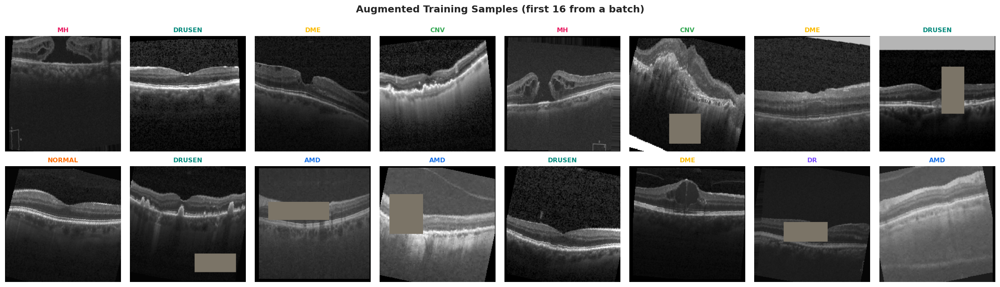

✅ Figure 4 saved.


In [3]:
# ── Transforms ────────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE + 20, IMG_SIZE + 20)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.1)),
])

val_test_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

# ── Datasets ──────────────────────────────────────────────────────────
train_dataset = datasets.ImageFolder(TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(VAL_DIR,   transform=val_test_transforms)
test_dataset  = datasets.ImageFolder(TEST_DIR,  transform=val_test_transforms)

assert list(train_dataset.class_to_idx.keys()) == CLASS_NAMES, \
    f"Class order mismatch! Found: {list(train_dataset.class_to_idx.keys())}"

# ── DataLoaders ───────────────────────────────────────────────────────
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print(f"{'='*50}")
print(f"  📦 Training samples   : {len(train_dataset):,}")
print(f"  📦 Validation samples : {len(val_dataset):,}")
print(f"  📦 Test samples       : {len(test_dataset):,}")
print(f"  🔁 Train batches      : {len(train_loader)}")
print(f"  🔁 Val   batches      : {len(val_loader)}")
print(f"{'='*50}")

# ── Visualize Augmented Samples ───────────────────────────────────────
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD ).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)

imgs, labels = next(iter(train_loader))
fig, axes = plt.subplots(2, 8, figsize=(20, 6))
fig.suptitle('Augmented Training Samples (first 16 from a batch)',
             fontsize=14, fontweight='bold')
for i in range(16):
    ax  = axes[i // 8][i % 8]
    img = denormalize(imgs[i]).permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.set_title(CLASS_NAMES[labels[i].item()], fontsize=9,
                 fontweight='bold', color=PAL[labels[i].item()])
    ax.axis('off')
plt.tight_layout()
plt.savefig('fig4_augmented_samples.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 4 saved.")

## 🧠 Step 3 — Model Architectures

### Model 1: EfficientNet-B3
- Scales network depth, width, and resolution uniformly using a **compound coefficient**
- Pretrained on ImageNet-1K (~1.2M images)
- Replaced final classifier head: `Linear(1536 → 512 → 8)`
- ~12M trainable parameters (fine-tuned from epoch 1)

### Model 2: Vision Transformer — ViT-B/16
- Splits the 224×224 image into **196 patches** of 16×16 pixels
- Each patch is linearly embedded and processed by **12 Transformer encoder blocks**
- Pretrained on ImageNet-21K, fine-tuned on ImageNet-1K
- Replaced classification head: `Linear(768 → 8)`
- ~86M parameters total

### Training Configuration
| Hyperparameter | EfficientNet-B3 | ViT-B/16 |
|---|---|---|
| Input Size | 224×224 | 224×224 |
| Optimizer | AdamW | AdamW |
| Learning Rate | 1e-4 | 5e-5 |
| Weight Decay | 1e-4 | 1e-4 |
| Scheduler | CosineAnnealingLR | CosineAnnealingLR |
| Loss | CE + Label Smoothing 0.1 | CE + Label Smoothing 0.1 |
| Epochs | 8 | 8 |
| Batch Size | 128 | 128 |

In [4]:
# ── Model Builder ─────────────────────────────────────────────────────
def build_efficientnet(num_classes=NUM_CLASSES, pretrained=True):
    model = timm.create_model('efficientnet_b3', pretrained=pretrained, num_classes=0)
    in_features = model.num_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.SiLU(),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model

def build_vit(num_classes=NUM_CLASSES, pretrained=True):
    model = timm.create_model('vit_base_patch16_224', pretrained=pretrained, num_classes=num_classes)
    return model

def count_params(model):
    total     = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

# ── AMP Scaler (Mixed Precision) ──────────────────────────────────────
scaler = torch.cuda.amp.GradScaler()

# ── Training & Evaluation Functions ──────────────────────────────────
def train_one_epoch(model, loader, criterion, optimizer, scheduler, epoch):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(loader, desc=f'  Train Epoch {epoch+1:02d}', leave=False, colour='blue')
    for imgs, labels in pbar:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad(set_to_none=True)

        # ── Mixed Precision Forward Pass ──────────────────────────────
        with torch.cuda.amp.autocast():
            outputs = model(imgs)
            loss    = criterion(outputs, labels)

        # ── Scaled Backward Pass ──────────────────────────────────────
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * imgs.size(0)
        preds         = outputs.argmax(dim=1)
        correct      += (preds == labels).sum().item()
        total        += imgs.size(0)
        pbar.set_postfix({'loss': f'{loss.item():.4f}', 'acc': f'{correct/total:.4f}'})

    scheduler.step()
    return running_loss / total, correct / total

@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)

        with torch.cuda.amp.autocast():
            outputs = model(imgs)
            loss    = criterion(outputs, labels)

        running_loss += loss.item() * imgs.size(0)
        preds         = outputs.argmax(dim=1)
        correct      += (preds == labels).sum().item()
        total        += imgs.size(0)
        all_preds .extend(preds .cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    return running_loss / total, correct / total, all_preds, all_labels

def get_optimizer_scheduler(model, lr, wd, epochs, steps_per_epoch):
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=lr/100)
    return optimizer, scheduler

# ── Training Loop ─────────────────────────────────────────────────────
def train_model(model, model_name, lr=1e-4, wd=1e-4):
    model = model.to(device)
    print(f"  ⚡ Running on: {torch.cuda.get_device_name(0)}")

    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer, scheduler = get_optimizer_scheduler(
        model, lr=lr, wd=wd, epochs=EPOCHS, steps_per_epoch=len(train_loader)
    )

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'lr': []}
    best_val_acc, best_state = 0.0, None
    t0 = time.time()

    print(f"\n{'='*60}")
    print(f"  🚀 Training {model_name} for {EPOCHS} epochs  [AMP ON]")
    print(f"{'='*60}")

    for epoch in range(EPOCHS):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, scheduler, epoch)
        val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
        current_lr = scheduler.get_last_lr()[0]

        history['train_loss'].append(train_loss)
        history['val_loss'  ].append(val_loss)
        history['train_acc' ].append(train_acc)
        history['val_acc'   ].append(val_acc)
        history['lr'        ].append(current_lr)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_state   = {k: v.clone() for k, v in model.state_dict().items()}
            tag = ' ⭐ Best'
        else:
            tag = ''

        print(f"  Ep {epoch+1:02d}/{EPOCHS} │ "
              f"Train Loss: {train_loss:.4f}  Acc: {train_acc:.4f} │ "
              f"Val Loss: {val_loss:.4f}  Acc: {val_acc:.4f} │ "
              f"LR: {current_lr:.2e}{tag}")

    elapsed = time.time() - t0
    print(f"\n  ✅ Training complete in {elapsed/60:.1f} min")
    print(f"  🏆 Best Val Accuracy: {best_val_acc:.4f} ({best_val_acc*100:.2f}%)")

    # ── Restore best weights ──────────────────────────────────────────
    model.load_state_dict(best_state)

    # ── Save model ────────────────────────────────────────────────────
    save_path = f'{model_name.replace(" ","_").replace("/","_").lower()}_best.pth'
    torch.save(best_state, save_path)
    print(f"  💾 Saved: {save_path}")

    return model, history, best_val_acc

print("✅ All model utilities defined with AMP support — ready to train!")

✅ All model utilities defined with AMP support — ready to train!


## 🏋️ Step 4 — Train EfficientNet-B3
Loading **EfficientNet-B3** with ImageNet pretrained weights and fine-tuning on the
OCT dataset. A custom 2-layer classification head is added on top.

In [5]:
# ── Build EfficientNet-B3 ─────────────────────────────────────────────
effnet = build_efficientnet(num_classes=NUM_CLASSES, pretrained=True)
total_p, train_p = count_params(effnet)
print(f"  EfficientNet-B3 │ Total params: {total_p/1e6:.2f}M │ Trainable: {train_p/1e6:.2f}M")

# ── Train ─────────────────────────────────────────────────────────────
effnet_model, effnet_history, effnet_best_val = train_model(
    effnet,
    model_name = 'EfficientNet-B3',
    lr         = 1e-4,
    wd         = 1e-4
)

# ── Final Test Evaluation ─────────────────────────────────────────────
criterion_eval = nn.CrossEntropyLoss()
eff_test_loss, eff_test_acc, eff_preds, eff_labels = evaluate(
    effnet_model, test_loader, criterion_eval)

print(f"\n  🧪 EfficientNet-B3 Test Accuracy : {eff_test_acc*100:.2f}%")
print(f"  🧪 EfficientNet-B3 Test Loss     : {eff_test_loss:.4f}")

model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

  EfficientNet-B3 │ Total params: 11.49M │ Trainable: 11.49M
  ⚡ Running on: Tesla T4

  🚀 Training EfficientNet-B3 for 8 epochs  [AMP ON]


  Train Epoch 01:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 01/8 │ Train Loss: 0.9833  Acc: 0.8151 │ Val Loss: 0.5883  Acc: 0.9457 │ LR: 9.62e-05 ⭐ Best


  Train Epoch 02:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 02/8 │ Train Loss: 0.5878  Acc: 0.9511 │ Val Loss: 0.5691  Acc: 0.9550 │ LR: 8.55e-05 ⭐ Best


  Train Epoch 03:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 03/8 │ Train Loss: 0.5613  Acc: 0.9627 │ Val Loss: 0.5551  Acc: 0.9589 │ LR: 6.94e-05 ⭐ Best


  Train Epoch 04:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 04/8 │ Train Loss: 0.5442  Acc: 0.9692 │ Val Loss: 0.5461  Acc: 0.9668 │ LR: 5.05e-05 ⭐ Best


  Train Epoch 05:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 05/8 │ Train Loss: 0.5361  Acc: 0.9729 │ Val Loss: 0.5501  Acc: 0.9636 │ LR: 3.16e-05


  Train Epoch 06:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 06/8 │ Train Loss: 0.5290  Acc: 0.9751 │ Val Loss: 0.5432  Acc: 0.9675 │ LR: 1.55e-05 ⭐ Best


  Train Epoch 07:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 07/8 │ Train Loss: 0.5248  Acc: 0.9778 │ Val Loss: 0.5426  Acc: 0.9671 │ LR: 4.77e-06


  Train Epoch 08:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 08/8 │ Train Loss: 0.5220  Acc: 0.9787 │ Val Loss: 0.5402  Acc: 0.9693 │ LR: 1.00e-06 ⭐ Best

  ✅ Training complete in 18.6 min
  🏆 Best Val Accuracy: 0.9693 (96.93%)
  💾 Saved: efficientnet-b3_best.pth

  🧪 EfficientNet-B3 Test Accuracy : 97.04%
  🧪 EfficientNet-B3 Test Loss     : 0.1701


## 🤖 Step 5 — Train Vision Transformer (ViT-B/16)
Loading **ViT-B/16** pretrained on ImageNet-21K. The model processes the 224×224 OCT
image as a sequence of **196 non-overlapping 16×16 patches** through 12 transformer layers.

In [6]:
# ── Build ViT-B/16 ────────────────────────────────────────────────────
vit = build_vit(num_classes=NUM_CLASSES, pretrained=True)
total_p, train_p = count_params(vit)
print(f"  ViT-B/16 │ Total params: {total_p/1e6:.2f}M │ Trainable: {train_p/1e6:.2f}M")

# ── Train ─────────────────────────────────────────────────────────────
vit_model, vit_history, vit_best_val = train_model(
    vit,
    model_name = 'ViT-B/16',
    lr         = 5e-5,
    wd         = 1e-4
)

# ── Final Test Evaluation ─────────────────────────────────────────────
vit_test_loss, vit_test_acc, vit_preds, vit_labels = evaluate(
    vit_model, test_loader, criterion_eval)

print(f"\n  🧪 ViT-B/16 Test Accuracy : {vit_test_acc*100:.2f}%")
print(f"  🧪 ViT-B/16 Test Loss     : {vit_test_loss:.4f}")

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

  ViT-B/16 │ Total params: 85.80M │ Trainable: 85.80M
  ⚡ Running on: Tesla T4

  🚀 Training ViT-B/16 for 8 epochs  [AMP ON]


  Train Epoch 01:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 01/8 │ Train Loss: 0.7514  Acc: 0.8714 │ Val Loss: 0.6093  Acc: 0.9446 │ LR: 4.81e-05 ⭐ Best


  Train Epoch 02:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 02/8 │ Train Loss: 0.5793  Acc: 0.9536 │ Val Loss: 0.5861  Acc: 0.9518 │ LR: 4.28e-05 ⭐ Best


  Train Epoch 03:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 03/8 │ Train Loss: 0.5599  Acc: 0.9610 │ Val Loss: 0.5497  Acc: 0.9639 │ LR: 3.47e-05 ⭐ Best


  Train Epoch 04:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 04/8 │ Train Loss: 0.5474  Acc: 0.9647 │ Val Loss: 0.5708  Acc: 0.9554 │ LR: 2.53e-05


  Train Epoch 05:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 05/8 │ Train Loss: 0.5370  Acc: 0.9699 │ Val Loss: 0.5549  Acc: 0.9614 │ LR: 1.58e-05


  Train Epoch 06:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 06/8 │ Train Loss: 0.5236  Acc: 0.9755 │ Val Loss: 0.5487  Acc: 0.9668 │ LR: 7.75e-06 ⭐ Best


  Train Epoch 07:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 07/8 │ Train Loss: 0.5163  Acc: 0.9789 │ Val Loss: 0.5345  Acc: 0.9704 │ LR: 2.38e-06 ⭐ Best


  Train Epoch 08:   0%|          | 0/144 [00:00<?, ?it/s]

  Ep 08/8 │ Train Loss: 0.5112  Acc: 0.9803 │ Val Loss: 0.5429  Acc: 0.9682 │ LR: 5.00e-07

  ✅ Training complete in 20.3 min
  🏆 Best Val Accuracy: 0.9704 (97.04%)
  💾 Saved: vit-b_16_best.pth

  🧪 ViT-B/16 Test Accuracy : 97.50%
  🧪 ViT-B/16 Test Loss     : 0.1595


## 📈 Step 6 — Training History Visualization
Plotting **loss and accuracy curves** for both models across all epochs.
A decreasing validation loss and increasing validation accuracy confirm
successful learning without overfitting.

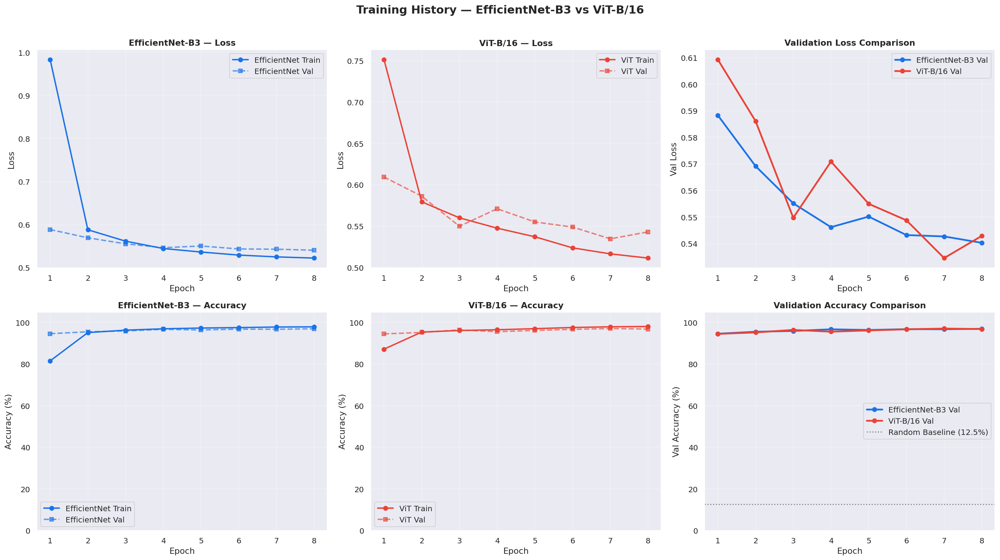

✅ Figure 5 saved.


In [7]:
def plot_training_history(eff_hist, vit_hist):
    fig, axes = plt.subplots(2, 3, figsize=(20, 11))
    fig.suptitle('Training History — EfficientNet-B3 vs ViT-B/16',
                 fontsize=16, fontweight='bold', y=1.01)

    epochs_x = range(1, EPOCHS + 1)

    # ── Loss curves ───────────────────────────────────────────────────
    ax = axes[0][0]
    ax.plot(epochs_x, eff_hist['train_loss'], 'o-', color='#1a73e8', linewidth=2, label='EfficientNet Train')
    ax.plot(epochs_x, eff_hist['val_loss'],   's--', color='#1a73e8', linewidth=2, alpha=0.65, label='EfficientNet Val')
    ax.set_title('EfficientNet-B3 — Loss', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    ax.legend(); ax.grid(True, alpha=0.3)

    ax = axes[0][1]
    ax.plot(epochs_x, vit_hist['train_loss'], 'o-', color='#ea4335', linewidth=2, label='ViT Train')
    ax.plot(epochs_x, vit_hist['val_loss'],   's--', color='#ea4335', linewidth=2, alpha=0.65, label='ViT Val')
    ax.set_title('ViT-B/16 — Loss', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    ax.legend(); ax.grid(True, alpha=0.3)

    # ── Combined loss ─────────────────────────────────────────────────
    ax = axes[0][2]
    ax.plot(epochs_x, eff_hist['val_loss'], 'o-', color='#1a73e8', linewidth=2.5, label='EfficientNet-B3 Val')
    ax.plot(epochs_x, vit_hist['val_loss'], 'o-', color='#ea4335', linewidth=2.5, label='ViT-B/16 Val')
    ax.set_title('Validation Loss Comparison', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Val Loss')
    ax.legend(); ax.grid(True, alpha=0.3)

    # ── Accuracy curves ───────────────────────────────────────────────
    ax = axes[1][0]
    ax.plot(epochs_x, [a*100 for a in eff_hist['train_acc']], 'o-', color='#1a73e8', linewidth=2, label='EfficientNet Train')
    ax.plot(epochs_x, [a*100 for a in eff_hist['val_acc']],   's--', color='#1a73e8', linewidth=2, alpha=0.65, label='EfficientNet Val')
    ax.set_title('EfficientNet-B3 — Accuracy', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy (%)')
    ax.legend(); ax.set_ylim(0, 105); ax.grid(True, alpha=0.3)

    ax = axes[1][1]
    ax.plot(epochs_x, [a*100 for a in vit_hist['train_acc']], 'o-', color='#ea4335', linewidth=2, label='ViT Train')
    ax.plot(epochs_x, [a*100 for a in vit_hist['val_acc']],   's--', color='#ea4335', linewidth=2, alpha=0.65, label='ViT Val')
    ax.set_title('ViT-B/16 — Accuracy', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy (%)')
    ax.legend(); ax.set_ylim(0, 105); ax.grid(True, alpha=0.3)

    # ── Combined val accuracy ─────────────────────────────────────────
    ax = axes[1][2]
    ax.plot(epochs_x, [a*100 for a in eff_hist['val_acc']], 'o-', color='#1a73e8', linewidth=2.5, label='EfficientNet-B3 Val')
    ax.plot(epochs_x, [a*100 for a in vit_hist['val_acc']], 'o-', color='#ea4335', linewidth=2.5, label='ViT-B/16 Val')
    ax.axhline(y=12.5, color='gray', linestyle=':', linewidth=1.5, label='Random Baseline (12.5%)')
    ax.set_title('Validation Accuracy Comparison', fontweight='bold'); ax.set_xlabel('Epoch'); ax.set_ylabel('Val Accuracy (%)')
    ax.legend(); ax.set_ylim(0, 105); ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('fig5_training_history.png', bbox_inches='tight', dpi=130)
    plt.show()
    print("✅ Figure 5 saved.")

plot_training_history(effnet_history, vit_history)

## 🗂️ Step 7 — Per-Class Metrics & Confusion Matrices
Evaluating **Precision, Recall, and F1-Score** for each of the 8 disease classes,
and visualizing the **Confusion Matrix** for both models on the unseen test set.

────────────────────────────────────────────────────────────
  EfficientNet-B3 — Confusion Matrix


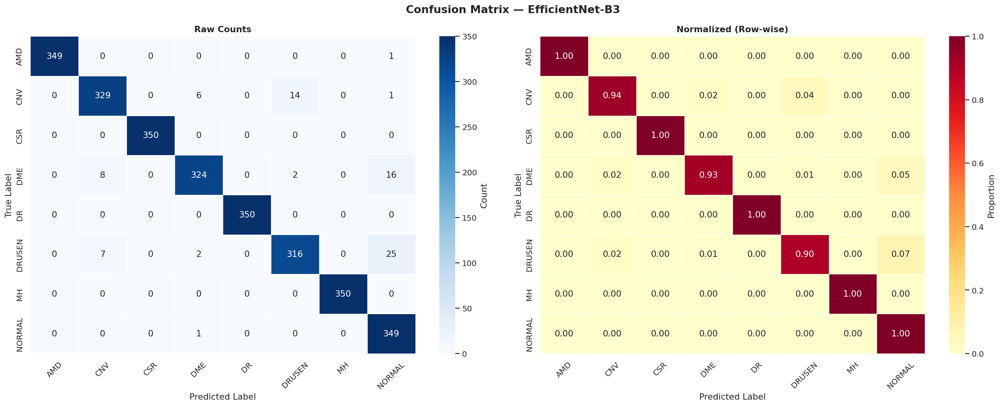

✅ Confusion matrix saved: fig_cm_efficientnet-b3.png
────────────────────────────────────────────────────────────
  ViT-B/16 — Confusion Matrix


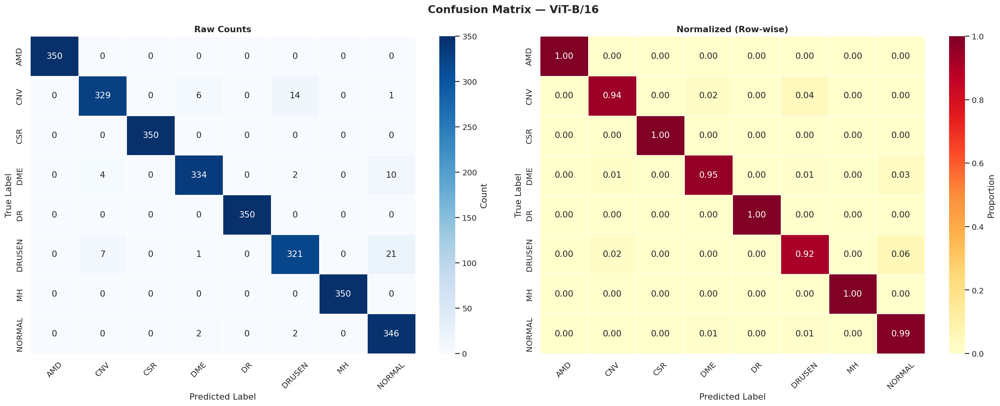

✅ Confusion matrix saved: fig_cm_vit-b_16.png

  📊 EfficientNet-B3 — Per-Class Metrics:
 Class                        Full Name Precision Recall F1-Score  Support
   AMD Age-related Macular Degeneration    1.0000 0.9971   0.9986      350
   CNV     Choroidal Neovascularization    0.9564 0.9400   0.9481      350
   CSR       Central Serous Retinopathy    1.0000 1.0000   1.0000      350
   DME           Diabetic Macular Edema    0.9730 0.9257   0.9488      350
    DR             Diabetic Retinopathy    1.0000 1.0000   1.0000      350
DRUSEN     Yellow Deposits Under Retina    0.9518 0.9029   0.9267      350
    MH                     Macular Hole    1.0000 1.0000   1.0000      350
NORMAL  Healthy Eyes (No Abnormalities)    0.8903 0.9971   0.9407      350

  Macro F1    : 0.9704
  Weighted F1 : 0.9704

  📊 ViT-B/16 — Per-Class Metrics:
 Class                        Full Name Precision Recall F1-Score  Support
   AMD Age-related Macular Degeneration    1.0000 1.0000   1.0000      350
   CN

In [8]:
def plot_confusion_matrix(y_true, y_pred, model_name, color):
    cm   = confusion_matrix(y_true, y_pred)
    cm_n = cm.astype('float') / cm.sum(axis=1)[:, None]

    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    fig.suptitle(f'Confusion Matrix — {model_name}',
                 fontsize=15, fontweight='bold')

    # Raw counts
    sns.heatmap(cm, annot=True, fmt='d', cmap=f'Blues',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
                ax=axes[0], linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Count'})
    axes[0].set_title('Raw Counts', fontweight='bold')
    axes[0].set_xlabel('Predicted Label', fontsize=12)
    axes[0].set_ylabel('True Label', fontsize=12)
    axes[0].tick_params(axis='x', rotation=45)

    # Normalized
    sns.heatmap(cm_n, annot=True, fmt='.2f', cmap='YlOrRd',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
                ax=axes[1], linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Proportion'}, vmin=0, vmax=1)
    axes[1].set_title('Normalized (Row-wise)', fontweight='bold')
    axes[1].set_xlabel('Predicted Label', fontsize=12)
    axes[1].set_ylabel('True Label', fontsize=12)
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    fname = f'fig_cm_{model_name.replace("/","_").replace(" ","_").lower()}.png'
    plt.savefig(fname, bbox_inches='tight', dpi=130)
    plt.show()
    print(f"✅ Confusion matrix saved: {fname}")
    return cm

print("─"*60)
print("  EfficientNet-B3 — Confusion Matrix")
eff_cm = plot_confusion_matrix(eff_labels, eff_preds, 'EfficientNet-B3', '#1a73e8')

print("─"*60)
print("  ViT-B/16 — Confusion Matrix")
vit_cm = plot_confusion_matrix(vit_labels, vit_preds, 'ViT-B/16', '#ea4335')

# ── Per-Class Metrics Table ───────────────────────────────────────────
def per_class_metrics(y_true, y_pred, model_name):
    report = classification_report(
        y_true, y_pred, target_names=CLASS_NAMES, output_dict=True)
    rows = []
    for cls in CLASS_NAMES:
        rows.append({
            'Class'    : cls,
            'Full Name': CLASS_FULL[cls],
            'Precision': f"{report[cls]['precision']:.4f}",
            'Recall'   : f"{report[cls]['recall']:.4f}",
            'F1-Score' : f"{report[cls]['f1-score']:.4f}",
            'Support'  : int(report[cls]['support'])
        })
    df = pd.DataFrame(rows)
    print(f"\n  📊 {model_name} — Per-Class Metrics:")
    print(df.to_string(index=False))
    print(f"\n  Macro F1    : {report['macro avg']['f1-score']:.4f}")
    print(f"  Weighted F1 : {report['weighted avg']['f1-score']:.4f}")
    return report

eff_report = per_class_metrics(eff_labels, eff_preds, 'EfficientNet-B3')
vit_report = per_class_metrics(vit_labels, vit_preds, 'ViT-B/16')

## ⚖️ Step 8 — Comparative Analysis
Head-to-head comparison of **EfficientNet-B3** vs **ViT-B/16** across all evaluation
metrics, including accuracy, precision, recall, F1-score, and per-class performance.

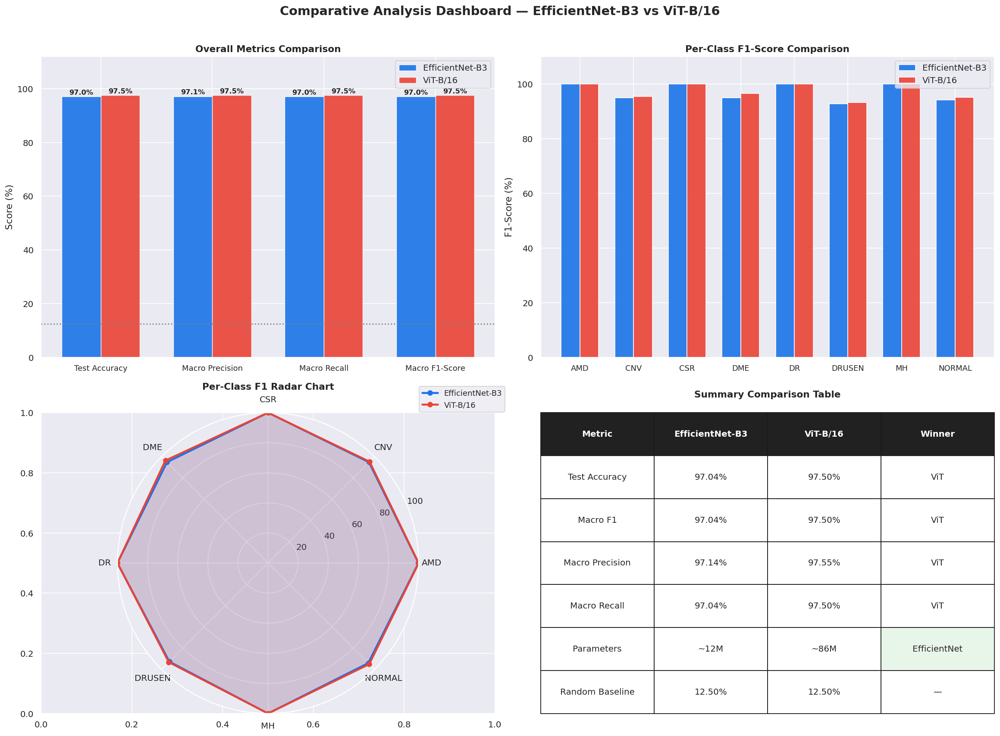

✅ Figure 6 saved.


In [9]:
# ── Bar chart: Accuracy / Precision / Recall / F1 ────────────────────
metrics_data = {
    'Test Accuracy' : [eff_test_acc * 100, vit_test_acc * 100],
    'Macro Precision': [
        precision_score(eff_labels, eff_preds, average='macro') * 100,
        precision_score(vit_labels, vit_preds, average='macro') * 100
    ],
    'Macro Recall'  : [
        recall_score(eff_labels, eff_preds, average='macro') * 100,
        recall_score(vit_labels, vit_preds, average='macro') * 100
    ],
    'Macro F1-Score': [
        f1_score(eff_labels, eff_preds, average='macro') * 100,
        f1_score(vit_labels, vit_preds, average='macro') * 100
    ],
}

fig, axes = plt.subplots(2, 2, figsize=(18, 13))
fig.suptitle('Comparative Analysis Dashboard — EfficientNet-B3 vs ViT-B/16',
             fontsize=16, fontweight='bold', y=1.01)

# ── Plot 1: Overall metrics grouped bar ───────────────────────────────
ax = axes[0][0]
x      = np.arange(len(metrics_data))
width  = 0.35
labels = list(metrics_data.keys())
eff_vals = [metrics_data[k][0] for k in labels]
vit_vals = [metrics_data[k][1] for k in labels]

b1 = ax.bar(x - width/2, eff_vals, width, label='EfficientNet-B3',
            color='#1a73e8', edgecolor='white', linewidth=0.8, alpha=0.9)
b2 = ax.bar(x + width/2, vit_vals, width, label='ViT-B/16',
            color='#ea4335', edgecolor='white', linewidth=0.8, alpha=0.9)
for b, v in zip(list(b1)+list(b2), eff_vals+vit_vals):
    ax.text(b.get_x() + b.get_width()/2, b.get_height() + 0.3,
            f'{v:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(labels, fontsize=10)
ax.set_ylabel('Score (%)'); ax.set_ylim(0, 112)
ax.set_title('Overall Metrics Comparison', fontweight='bold')
ax.legend(fontsize=11); ax.axhline(12.5, color='gray', linestyle=':', linewidth=1.5)

# ── Plot 2: Per-class F1 comparison ───────────────────────────────────
ax = axes[0][1]
eff_f1_cls = [eff_report[c]['f1-score']*100 for c in CLASS_NAMES]
vit_f1_cls = [vit_report[c]['f1-score']*100 for c in CLASS_NAMES]
x2 = np.arange(NUM_CLASSES)
ax.bar(x2 - width/2, eff_f1_cls, width, label='EfficientNet-B3',
       color='#1a73e8', edgecolor='white', alpha=0.9)
ax.bar(x2 + width/2, vit_f1_cls, width, label='ViT-B/16',
       color='#ea4335', edgecolor='white', alpha=0.9)
ax.set_xticks(x2); ax.set_xticklabels(CLASS_NAMES, fontsize=10)
ax.set_ylabel('F1-Score (%)'); ax.set_ylim(0, 110)
ax.set_title('Per-Class F1-Score Comparison', fontweight='bold'); ax.legend(fontsize=11)

# ── Plot 3: Radar / spider chart ─────────────────────────────────────
ax3 = fig.add_subplot(2, 2, 3, polar=True)
angles = np.linspace(0, 2*np.pi, NUM_CLASSES, endpoint=False).tolist()
angles += angles[:1]
eff_f1_r = eff_f1_cls + eff_f1_cls[:1]
vit_f1_r = vit_f1_cls + vit_f1_cls[:1]
ax3.plot(angles, eff_f1_r, 'o-', color='#1a73e8', linewidth=2.5, label='EfficientNet-B3')
ax3.fill(angles, eff_f1_r, color='#1a73e8', alpha=0.15)
ax3.plot(angles, vit_f1_r, 'o-', color='#ea4335', linewidth=2.5, label='ViT-B/16')
ax3.fill(angles, vit_f1_r, color='#ea4335', alpha=0.15)
ax3.set_xticks(angles[:-1]); ax3.set_xticklabels(CLASS_NAMES, fontsize=11)
ax3.set_ylim(0, 100); ax3.set_title('Per-Class F1 Radar Chart', fontweight='bold', pad=30, y=1.00)
ax3.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=10)

# ── Plot 4: Summary comparison table ─────────────────────────────────
ax = axes[1][1]; ax.axis('off')
table_data = [
    ['Metric', 'EfficientNet-B3', 'ViT-B/16', 'Winner'],
    ['Test Accuracy',
     f"{eff_test_acc*100:.2f}%", f"{vit_test_acc*100:.2f}%",
     'EfficientNet' if eff_test_acc >= vit_test_acc else 'ViT'],
    ['Macro F1',
     f"{f1_score(eff_labels,eff_preds,average='macro')*100:.2f}%",
     f"{f1_score(vit_labels,vit_preds,average='macro')*100:.2f}%",
     'EfficientNet' if f1_score(eff_labels,eff_preds,average='macro')
                      >= f1_score(vit_labels,vit_preds,average='macro') else 'ViT'],
    ['Macro Precision',
     f"{precision_score(eff_labels,eff_preds,average='macro')*100:.2f}%",
     f"{precision_score(vit_labels,vit_preds,average='macro')*100:.2f}%",
     'EfficientNet' if precision_score(eff_labels,eff_preds,average='macro')
                      >= precision_score(vit_labels,vit_preds,average='macro') else 'ViT'],
    ['Macro Recall',
     f"{recall_score(eff_labels,eff_preds,average='macro')*100:.2f}%",
     f"{recall_score(vit_labels,vit_preds,average='macro')*100:.2f}%",
     'EfficientNet' if recall_score(eff_labels,eff_preds,average='macro')
                      >= recall_score(vit_labels,vit_preds,average='macro') else 'ViT'],
    ['Parameters',  '~12M', '~86M', 'EfficientNet'],
    ['Random Baseline', '12.50%', '12.50%', '—'],
]
tbl = ax.table(cellText=table_data[1:], colLabels=table_data[0],
               cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
tbl.auto_set_font_size(False); tbl.set_fontsize(11)
for (r, c), cell in tbl.get_celld().items():
    if r == 0: cell.set_facecolor('#212121'); cell.set_text_props(color='white', fontweight='bold')
    elif c == 3 and r > 0:
        cell.set_facecolor('#e8f5e9') if 'EfficientNet' in cell.get_text().get_text() else None
ax.set_title('Summary Comparison Table', fontweight='bold', pad=20)

plt.tight_layout()
plt.savefig('fig6_comparative_analysis.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 6 saved.")

## 🔍 Step 9 — Inference Demo on Test Images
Visualizing the **best model's predictions** on random test samples.
Each image shows the predicted class, true class, confidence score,
and whether the prediction was correct or incorrect.

🏆 Best Model: ViT-B/16  (97.50%)


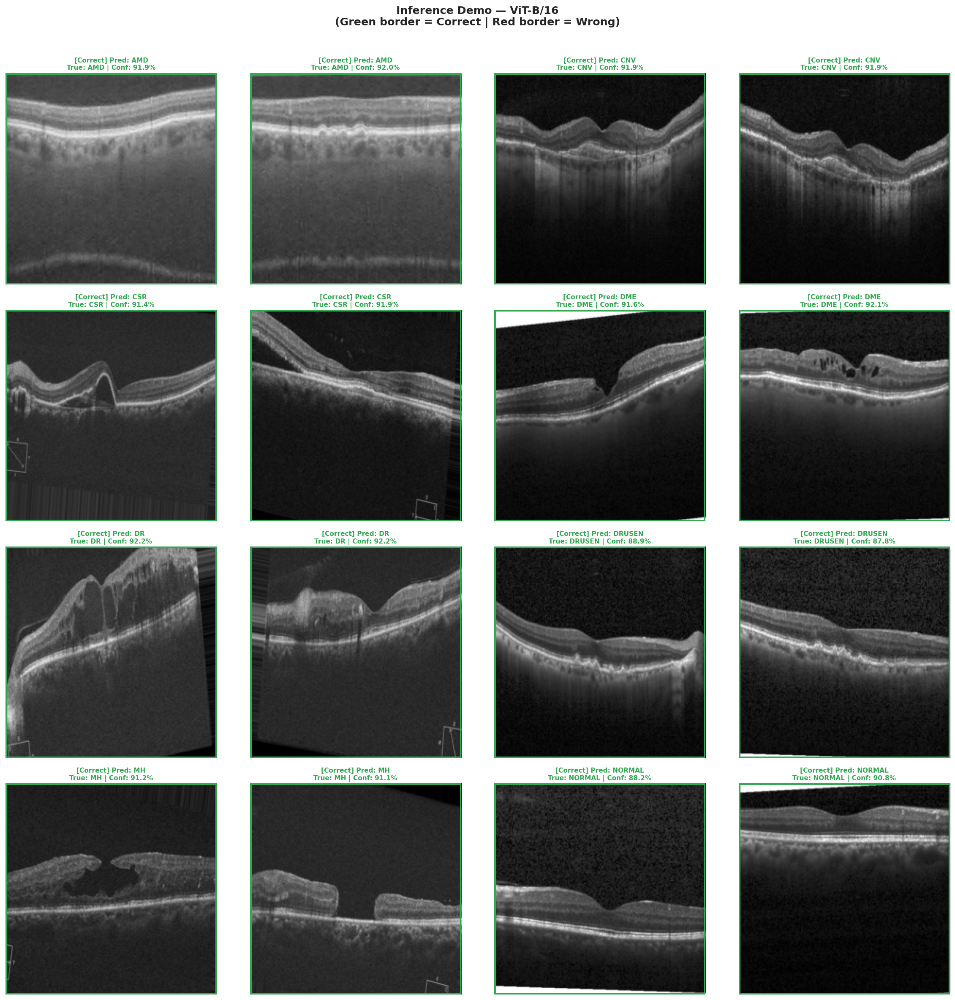

✅ Figure 7 saved.

  Sample prediction accuracy: 16/16 = 100.0%


In [10]:
# ── Determine best model ──────────────────────────────────────────────
if eff_test_acc >= vit_test_acc:
    best_model = effnet_model
    best_name  = 'EfficientNet-B3'
    best_color = '#1a73e8'
    print(f"🏆 Best Model: EfficientNet-B3  ({eff_test_acc*100:.2f}%)")
else:
    best_model = vit_model
    best_name  = 'ViT-B/16'
    best_color = '#ea4335'
    print(f"🏆 Best Model: ViT-B/16  ({vit_test_acc*100:.2f}%)")

# ── Inference on random test samples ─────────────────────────────────
best_model.eval()
softmax = nn.Softmax(dim=1)

n_per_class = 2
cls_buckets = {i: [] for i in range(NUM_CLASSES)}

for imgs, labels in test_loader:
    for img, lbl in zip(imgs, labels.numpy()):
        idx = int(lbl)
        if len(cls_buckets[idx]) < n_per_class:
            cls_buckets[idx].append(img)
    if all(len(v) == n_per_class for v in cls_buckets.values()):
        break

# Interleave classes: AMD×2, CNV×2, ... → natural visual spread across grid
sample_imgs, sample_labels = [], []
for cls_idx in range(NUM_CLASSES):
    for img in cls_buckets[cls_idx]:
        sample_imgs.append(img)
        sample_labels.append(cls_idx)

sample_imgs = torch.stack(sample_imgs)
n_samples   = len(sample_imgs)

with torch.no_grad():
    with torch.cuda.amp.autocast():
        preds_logits = best_model(sample_imgs.to(device))
    preds_prob   = softmax(preds_logits).cpu()
    preds_class  = preds_prob.argmax(dim=1).numpy()
    preds_conf   = preds_prob.max(dim=1).values.numpy()

# ── Inference Grid Plot ───────────────────────────────────────────────
fig, axes = plt.subplots(4, 4, figsize=(18, 18))
fig.suptitle(f'Inference Demo — {best_name}\n(Green border = Correct | Red border = Wrong)',
             fontsize=14, fontweight='bold', y=1.01)

for idx, ax in enumerate(axes.flatten()):
    img   = denormalize(sample_imgs[idx]).permute(1, 2, 0).numpy()
    true  = sample_labels[idx]
    pred  = preds_class[idx]
    conf  = preds_conf[idx]
    correct = (true == pred)

    ax.imshow(img)
    ax.axis('off')
    border_color = '#34a853' if correct else '#ea4335'
    for spine in ax.spines.values():
        spine.set_edgecolor(border_color); spine.set_linewidth(4)
    ax.set_visible(True)

    status  = '[Correct]' if correct else '[Wrong]'
    title   = (f"{status} Pred: {CLASS_NAMES[pred]}\n"
               f"True: {CLASS_NAMES[true]} | Conf: {conf*100:.1f}%")
    ax.set_title(title, fontsize=8.5, fontweight='bold',
                 color=border_color, pad=4)
    # Draw colored box around image
    rect = mpatches.FancyBboxPatch(
        (0, 0), 1, 1, transform=ax.transAxes,
        boxstyle='square,pad=0', linewidth=4,
        edgecolor=border_color, facecolor='none')
    ax.add_patch(rect)

plt.tight_layout()
plt.savefig('fig7_inference_demo.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 7 saved.")

# Quick accuracy summary on our sample
n_correct = sum(1 for t, p in zip(sample_labels, preds_class) if t == p)
print(f"\n  Sample prediction accuracy: {n_correct}/{n_samples} = {n_correct/n_samples*100:.1f}%")

## 🎯 Step 10 — Per-Class Confidence Analysis
Visualizing the **average prediction confidence** for each class when the model
classifies that class correctly vs incorrectly. High confidence on correct predictions
and low confidence on incorrect ones indicates a well-calibrated model.

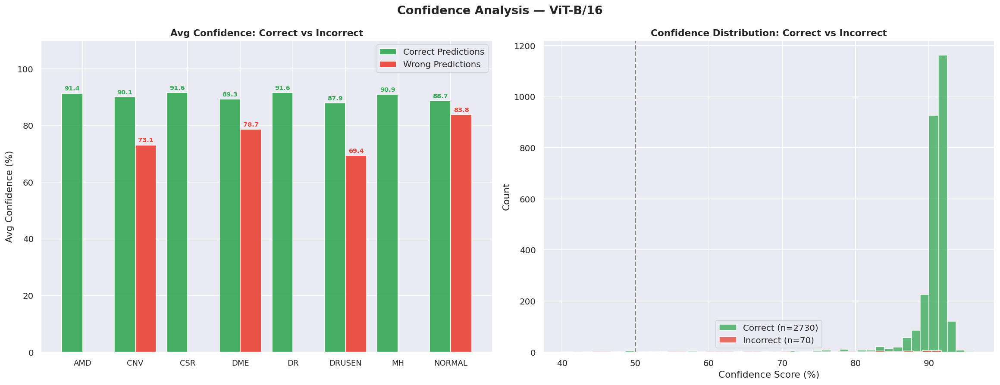

✅ Figure 8 saved.

  🏁 FINAL RESULTS SUMMARY
  Metric                          EfficientNet-B3     ViT-B/16
  ──────────────────────────────────────────────────────────
  Test Accuracy                            97.04%       97.50%
  Macro Precision                          97.14%       97.55%
  Macro Recall                             97.04%       97.50%
  Macro F1-Score                           97.04%       97.50%
  ──────────────────────────────────────────────────────────
  Random Baseline                          12.50%       12.50%

  🏆 Best Model : ViT-B/16  (97.50%)

  📁 Saved Figures:
     • fig1_class_distribution.png
     • fig2_sample_images.png
     • fig3_dimension_dist.png
     • fig4_augmented_samples.png
     • fig5_training_history.png
     • fig6_comparative_analysis.png
     • fig7_inference_demo.png
     • fig8_confidence_analysis.png
     • fig_cm_efficientnet-b3.png
     • fig_cm_vit-b_16.png

  💾 Saved Models:
     • efficientnet-b3_best.pth
     • vit-b_16_bes

In [11]:
# ── Confidence Analysis ───────────────────────────────────────────────
best_model.eval()
all_confs, all_preds_final, all_labels_final = [], [], []

with torch.no_grad():
    for imgs, labels in tqdm(test_loader, desc='  Collecting confidences', leave=False):
        imgs = imgs.to(device)
        with torch.cuda.amp.autocast():
            logits = best_model(imgs)
        probs  = softmax(logits).cpu()
        confs  = probs.max(dim=1).values
        preds  = probs.argmax(dim=1)
        all_confs .extend(confs .numpy())
        all_preds_final .extend(preds .numpy())
        all_labels_final.extend(labels.numpy())

all_confs  = np.array(all_confs)
all_preds_f = np.array(all_preds_final)
all_labels_f= np.array(all_labels_final)
correct_mask = (all_preds_f == all_labels_f)

# Per-class avg confidence (correct & incorrect)
cls_conf_correct = []
cls_conf_wrong   = []
for i, cls in enumerate(CLASS_NAMES):
    cls_mask = (all_labels_f == i)
    conf_c   = all_confs[cls_mask &  correct_mask]
    conf_w   = all_confs[cls_mask & ~correct_mask]
    cls_conf_correct.append(conf_c.mean() * 100 if len(conf_c) > 0 else 0)
    cls_conf_wrong  .append(conf_w.mean() * 100 if len(conf_w) > 0 else 0)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle(f'Confidence Analysis — {best_name}', fontsize=15, fontweight='bold')

x3 = np.arange(NUM_CLASSES)
axes[0].bar(x3 - 0.2, cls_conf_correct, 0.4, label='Correct Predictions',
            color='#34a853', edgecolor='white', alpha=0.9)
axes[0].bar(x3 + 0.2, cls_conf_wrong,   0.4, label='Wrong Predictions',
            color='#ea4335', edgecolor='white', alpha=0.9)
axes[0].set_xticks(x3); axes[0].set_xticklabels(CLASS_NAMES, fontsize=10)
axes[0].set_ylabel('Avg Confidence (%)'); axes[0].set_ylim(0, 110)
axes[0].set_title('Avg Confidence: Correct vs Incorrect', fontweight='bold')
axes[0].legend(fontsize=11)
for i, (c, w) in enumerate(zip(cls_conf_correct, cls_conf_wrong)):
    axes[0].text(i - 0.2, c + 1, f'{c:.1f}', ha='center', fontsize=8, fontweight='bold', color='#34a853')
    if w > 0:
        axes[0].text(i + 0.2, w + 1, f'{w:.1f}', ha='center', fontsize=8, fontweight='bold', color='#ea4335')

# Overall confidence histogram
axes[1].hist(all_confs[correct_mask]*100,  bins=40, alpha=0.75, color='#34a853',
             label=f'Correct (n={correct_mask.sum()})', edgecolor='white')
axes[1].hist(all_confs[~correct_mask]*100, bins=40, alpha=0.75, color='#ea4335',
             label=f'Incorrect (n={(~correct_mask).sum()})', edgecolor='white')
axes[1].set_xlabel('Confidence Score (%)'); axes[1].set_ylabel('Count')
axes[1].set_title('Confidence Distribution: Correct vs Incorrect', fontweight='bold')
axes[1].legend(fontsize=11); axes[1].axvline(50, color='gray', linestyle='--', linewidth=1.5)

plt.tight_layout()
plt.savefig('fig8_confidence_analysis.png', bbox_inches='tight', dpi=130)
plt.show()
print("✅ Figure 8 saved.")

# ── Final Project Summary ─────────────────────────────────────────────
print(f"\n{'='*65}")
print(f"  🏁 FINAL RESULTS SUMMARY")
print(f"{'='*65}")
print(f"  {'Metric':<30} {'EfficientNet-B3':>16} {'ViT-B/16':>12}")
print(f"  {'─'*58}")
print(f"  {'Test Accuracy':<30} {eff_test_acc*100:>15.2f}% {vit_test_acc*100:>11.2f}%")
print(f"  {'Macro Precision':<30} {precision_score(eff_labels,eff_preds,average='macro')*100:>15.2f}% {precision_score(vit_labels,vit_preds,average='macro')*100:>11.2f}%")
print(f"  {'Macro Recall':<30} {recall_score(eff_labels,eff_preds,average='macro')*100:>15.2f}% {recall_score(vit_labels,vit_preds,average='macro')*100:>11.2f}%")
print(f"  {'Macro F1-Score':<30} {f1_score(eff_labels,eff_preds,average='macro')*100:>15.2f}% {f1_score(vit_labels,vit_preds,average='macro')*100:>11.2f}%")
print(f"  {'─'*58}")
print(f"  {'Random Baseline':<30} {'12.50%':>16} {'12.50%':>12}")
print(f"{'='*65}")
print(f"\n  🏆 Best Model : {best_name}  ({max(eff_test_acc, vit_test_acc)*100:.2f}%)")
print(f"\n  📁 Saved Figures:")
for i in range(1, 9):
    figs = glob.glob(f'fig{i}_*.png') + glob.glob(f'fig_cm_*.png')
for f in sorted(glob.glob('fig*.png')):
    print(f"     • {f}")
print(f"\n  💾 Saved Models:")
for f in glob.glob('*.pth'):
    print(f"     • {f}")
print(f"{'='*65}")
print(f"\n✅ Project Complete — CSE465 | Arka Karmoker | 2112343042 | arka.karmoker@northsouth.edu")